# Find survey intersections between groups

This notebooks demonstrates the `grouped` method of finding crossovers or intersections between the flights or lines of a survey. See the previous notebook for the basics of finding crossovers.

In [40]:
%load_ext autoreload
%autoreload 2


import logging

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.io as pio
import verde as vd

import airbornegeo

# setup logging to get some additional info from the airbornegeo functions
logging.getLogger("airbornegeo").setLevel("INFO")
logging.basicConfig()
pio.renderers.default = "notebook"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

This is a subset of the BAS AGAP survey over Antarctica's Gamburtsev Subglacial Mountains. The file is downloaded and subset in the notebook `AGAP_magnetic_survey`.

In [41]:
data_df = pd.read_csv("data/AGAP_magnetic_survey_processed_blocked.csv")
data_df = data_df[
    [
        "easting",
        "northing",
        "height",
        "line",
        "unixtime",
        "distance_along_line",
        "mag",
    ]
]

data_df = data_df.rename(columns={"line": "line_id"})

data_df = data_df.rename(columns={"distance_along_line": "along_line_distance"})

# for testing limit number of lines
data_df = data_df[~data_df.line_id.between(133, 142)]
data_df = data_df[~data_df.line_id.between(168, 176)]
data_df = data_df[
    (data_df.line_id.isin(data_df.line_id.unique()[::2])) | (data_df.line_id >= 143)
]

# define survey lines (0) vs tie lines (1)
data_df["line_type"] = np.where(data_df.line_id >= 142, 1, 0)

data_df.head()

,easting,northing,height,line_id,unixtime,along_line_distance,mag,line_type
0,621152.853769,159064.167598,4112.55,1,1.229500e+09,81.451091,-34.245,0
1,621367.339673,159092.051982,4119.45,1,1.229500e+09,297.742539,-37.740,0
2,621580.287957,159122.206492,4124.15,1,1.229500e+09,512.819231,-40.975,0
3,621766.100699,159150.747140,4127.50,1,1.229500e+09,700.811387,-43.430,0
4,621924.954435,159176.326498,4131.00,1,1.229500e+09,861.711758,-45.300,0


In [ ]:
survey = airbornegeo.Survey(
    data_df,
    line_column="line_id",
    line_type_column="line_type",
    distance_column="along_line_distance",
)
survey

In [42]:
print("Total number of lines:", len(data_df.line_id.unique()))

Total number of lines: 121


In [43]:
print("Number of survey lines:", len(data_df[data_df.line_type == 0].line_id.unique()))

Number of survey lines: 66


In [44]:
print("Number of tie lines:", len(data_df[data_df.line_type == 1].line_id.unique()))

Number of tie lines: 55


This survey has 121 lines, 66 ~E-W survey lines, and 55 ~N-S tie lines. They are marked with the column `line_type`, with values of 0 or 1. We plot the each line below with different colors.

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ax = survey.plot(ax=ax, color_by="line_id", categorical=True)

## Calculate intersections of lines and ties

We want to calculate the theoretical intersection points between lines of different type. These types are denoted in the dataframe by the column 'line_type'. In our case, this column has values of 0 for E-W survey lines, and 1 for N-S tie lines. We referred to this as the "groups" method, since we only consider intersections between lines of two different types. 

If two lines of the same type were to cross, we would not count this as an intersect. In the next notebook we will demonstrate the "network" method, which considers all intersection between any combination of line, regardless of their type.

In [ ]:
survey.create_intersection_table(method="groups", buffer_dist=500)
inters = survey.intersections
inters

Below are two maps showing the results. The second is interactive and lets you move around, zoom in, and see info associated with each intersection.

/home/mdtanker/airbornegeo/.pixi/envs/default/lib/python3.14/site-packages/pandas/plotting/_matplotlib/core.py:1388: UserWarning: The pixel maker ',' is not supported on scatter(); using a finite-sized square instead, which is not necessarily 1 pixel in size. Use the square marker 's' instead to suppress this warning.
  scatter = ax.scatter(


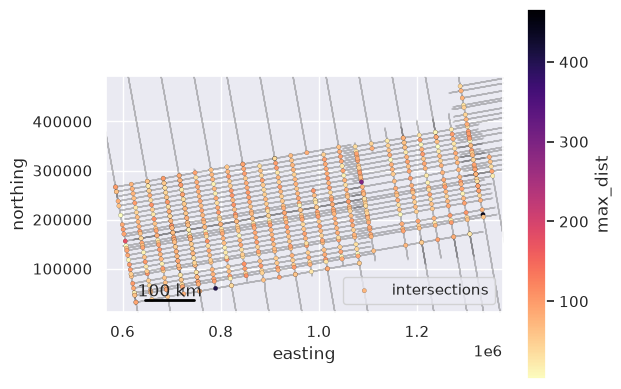

In [47]:
ax = data_df.plot.scatter(
    "easting",
    "northing",
    color="k",
    s=1,
    lw=0,
    marker=",",
    alpha=0.01,
)
inters.plot.scatter(
    "easting",
    "northing",
    c="max_dist",
    s=10,
    cmap="magma_r",
    marker="o",
    edgecolor="black",
    linewidth=0.1,
    ax=ax,
    label="intersections",
)
# zoom into region with intersections
reg = vd.get_region((inters.easting, inters.northing))
reg = vd.pad_region(reg, 20e3)
ax.set_xlim(reg[0], reg[1])
ax.set_ylim(reg[2], reg[3])

airbornegeo.add_scalebar(ax, 100e3)
ax.set_aspect("equal")

In [48]:
fig = airbornegeo.plotly_points(
    data_df,
    color="gray",
    hover_cols=["line_id"],
    size=1,
)
fig = airbornegeo.plotly_points(
    inters,
    fig=fig,
    color_col="max_dist",
    hover_cols=["line1", "line2", "is_buffered"],
    size=4,
    edge_width=0.2,
    cmap="magma_r",
    robust=False,
)

fig.show()

We can analyze the `max_dist` values to see if there are any outlier crossovers which are really far from the nearest data. This shows there are a few crossovers over 400 m away from the line data. These can be excluded with `cutoff_dist`.

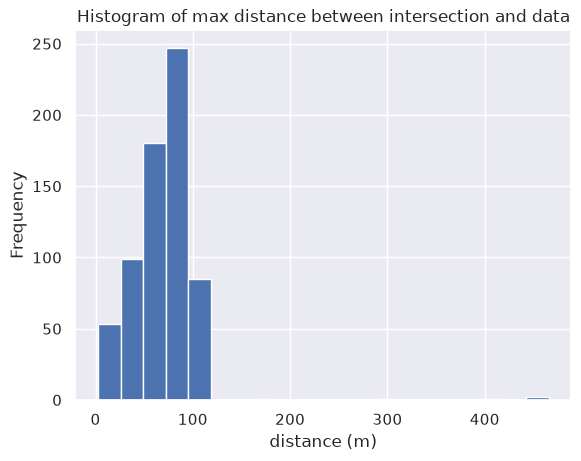

In [49]:
ax = inters.max_dist.plot.hist(bins=20)
ax.set_xlabel("distance (m)")
ax.set_title("Histogram of max distance between intersection and data");

We can also see which lines don't have any intersections.

In [ ]:
survey.lines_without_intersections()

Or which pairs of lines have multiple intersections.

In [51]:
inters[inters.duplicated(subset=["line1", "line2"], keep=False)]

,line1,line2,is_buffered,is_proximity,geometry,easting,northing,max_dist
